In [17]:
from basicpy import BaSiC
import numpy as np

import zarr
from matplotlib import pyplot as plt
import seaborn as sns

In [18]:
# path = '/u/home/f/f7xiesnm/project-zipursky/data/hold/lt172/r1_export.n5'
path = "/u/scratch/f/f7xiesnm/lt172_gene_r1/dataset.n5"
zarr_data = zarr.open(store=zarr.N5Store(path), mode='r')

tileshape = zarr_data[f'setup0/timepoint0/s3'].shape
print(tileshape)

(371, 240, 240)


In [19]:
n = tileshape[0]

In [20]:
image_alltiles = np.vstack([
    zarr_data[f'setup0/timepoint0/s3'][...],
    zarr_data[f'setup1/timepoint0/s3'][...],
    zarr_data[f'setup2/timepoint0/s3'][...],
    zarr_data[f'setup3/timepoint0/s3'][...],
])
    
image_alltiles.shape #images.shape, images2.shape

(1484, 240, 240)

In [21]:
images = image_alltiles

In [22]:
%%time
basic = BaSiC(get_darkfield=False, smoothness_flatfield=1)
basic.fit(images)
images_transformed = (images - basic.darkfield[np.newaxis])/ basic.flatfield[np.newaxis]

CPU times: user 5min 49s, sys: 2min 56s, total: 8min 46s
Wall time: 1min 51s


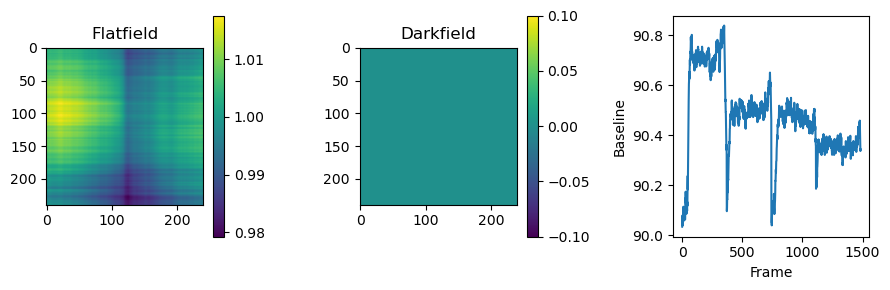

In [23]:
fig, axes = plt.subplots(1, 3, figsize=(9, 3))
im = axes[0].imshow(basic.flatfield)
fig.colorbar(im, ax=axes[0])
axes[0].set_title("Flatfield")
im = axes[1].imshow(basic.darkfield)
fig.colorbar(im, ax=axes[1])
axes[1].set_title("Darkfield")
axes[2].plot(basic.baseline)
axes[2].set_xlabel("Frame")
axes[2].set_ylabel("Baseline")
fig.tight_layout()

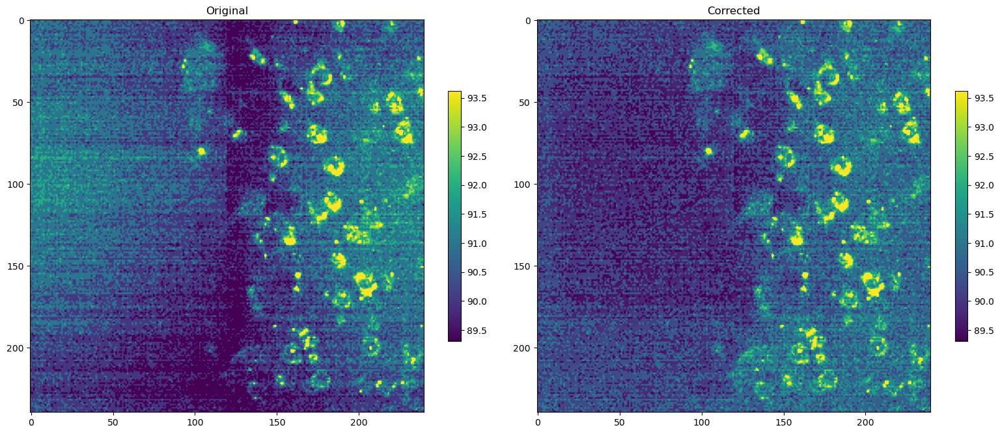

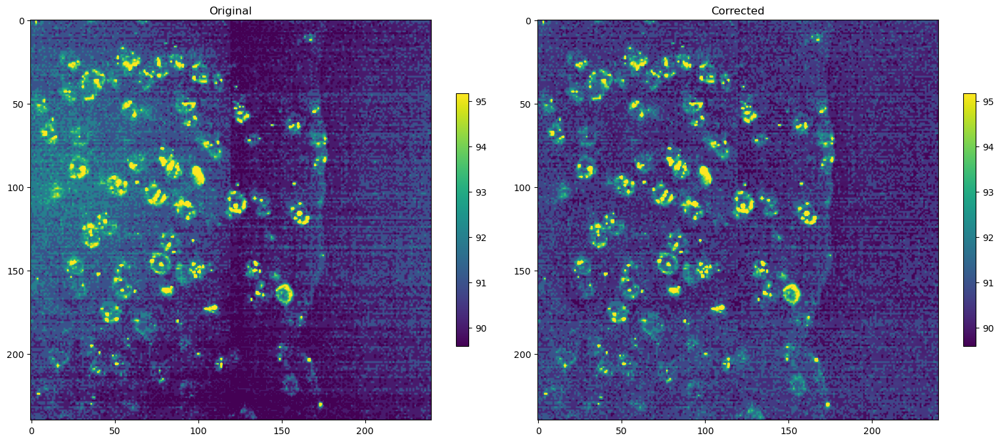

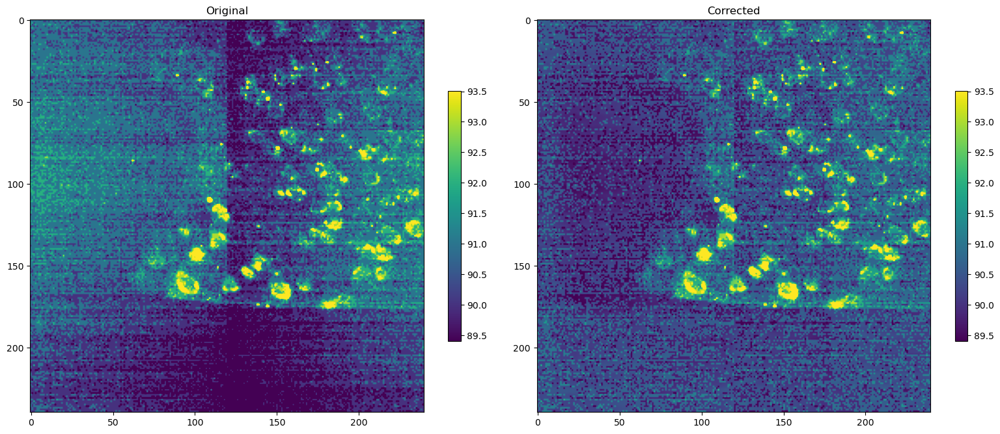

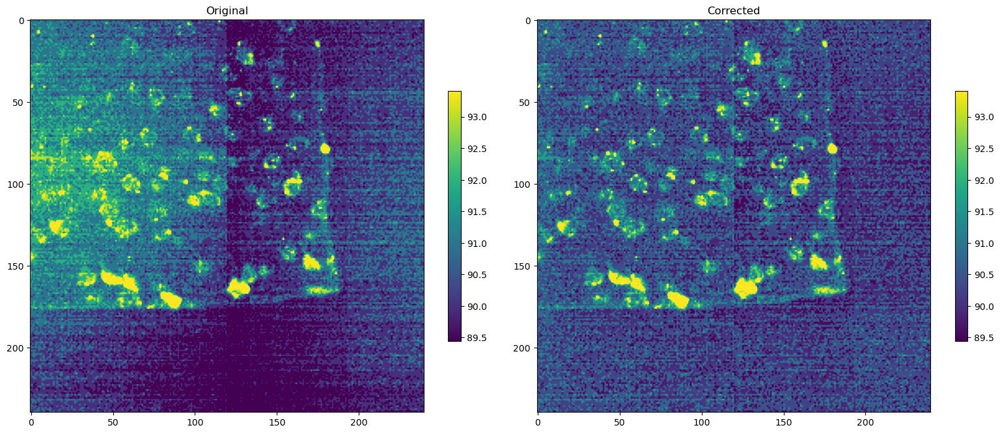

In [24]:
i = 50
for idx in range(4):
    i = 50+idx*n
    
    vmin = np.percentile(images_transformed[i], 5)
    vmax = np.percentile(images_transformed[i], 99)

    fig, axes = plt.subplots(1, 2, figsize=(16,8))
    im = axes[0].imshow(images[i], vmin=vmin, vmax=vmax)
    fig.colorbar(im, ax=axes[0], shrink=0.5)
    axes[0].set_title("Original")
    im = axes[1].imshow(images_transformed[i], vmin=vmin, vmax=vmax)
    fig.colorbar(im, ax=axes[1], shrink=0.5)
    axes[1].set_title("Corrected")
    fig.tight_layout()

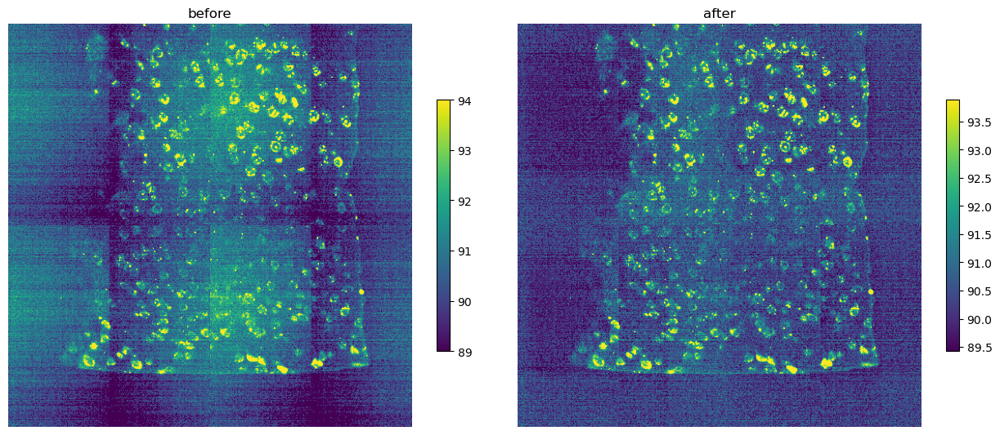

In [25]:
fig, axs = plt.subplots(1,2,figsize=(8*2,8*1))
ax = axs[0]
merged_img = np.vstack([
    np.hstack([images[50+0*n], images[50+1*n],]),
    np.hstack([images[50+2*n], images[50+3*n],]),
])
vmin = np.percentile(merged_img, 5)
vmax = np.percentile(merged_img, 99)
g = ax.imshow(merged_img, vmin=vmin, vmax=vmax)
ax.axis('off') #(False)
fig.colorbar(g, shrink=0.5)
ax.set_title('before')

ax = axs[1]
merged_img = np.vstack([
    np.hstack([images_transformed[50+0*n], images_transformed[50+1*n],]),
    np.hstack([images_transformed[50+2*n], images_transformed[50+3*n],]),
])
vmin = np.percentile(merged_img, 5)
vmax = np.percentile(merged_img, 99)
g = ax.imshow(merged_img, vmin=vmin, vmax=vmax)
ax.axis('off') #(False)
fig.colorbar(g, shrink=0.5)
ax.set_title('after')

fig.subplots_adjust(wspace=0.01)
plt.show()

# channel 2 (c1)

In [10]:
image_alltiles2 = np.vstack([
    zarr_data[f'setup4/timepoint0/s3'][...],
    zarr_data[f'setup5/timepoint0/s3'][...],
    zarr_data[f'setup6/timepoint0/s3'][...],
    zarr_data[f'setup7/timepoint0/s3'][...],
])
    
image_alltiles2.shape #images.shape, images2.shape

(1484, 240, 240)

In [11]:
images = image_alltiles2

In [12]:
%%time
basic = BaSiC(get_darkfield=False, smoothness_flatfield=1)
basic.fit(images)
images_transformed = (images - basic.darkfield[np.newaxis])/ basic.flatfield[np.newaxis]

CPU times: user 4min 10s, sys: 1min 11s, total: 5min 22s
Wall time: 1min 19s


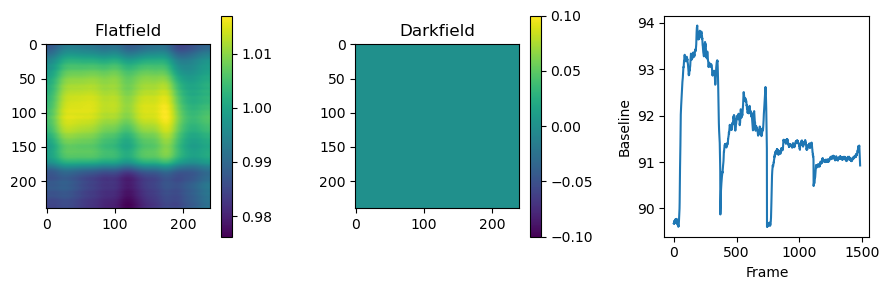

In [13]:
fig, axes = plt.subplots(1, 3, figsize=(9, 3))
im = axes[0].imshow(basic.flatfield)
fig.colorbar(im, ax=axes[0])
axes[0].set_title("Flatfield")
im = axes[1].imshow(basic.darkfield)
fig.colorbar(im, ax=axes[1])
axes[1].set_title("Darkfield")
axes[2].plot(basic.baseline)
axes[2].set_xlabel("Frame")
axes[2].set_ylabel("Baseline")
fig.tight_layout()

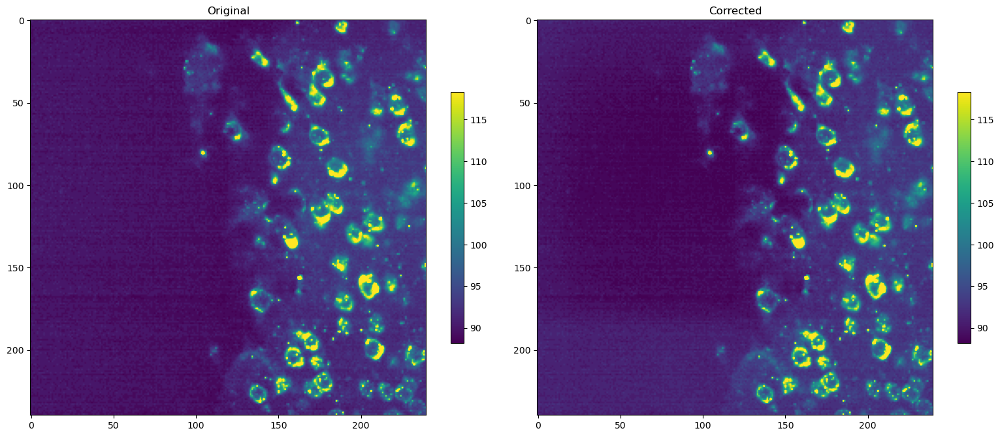

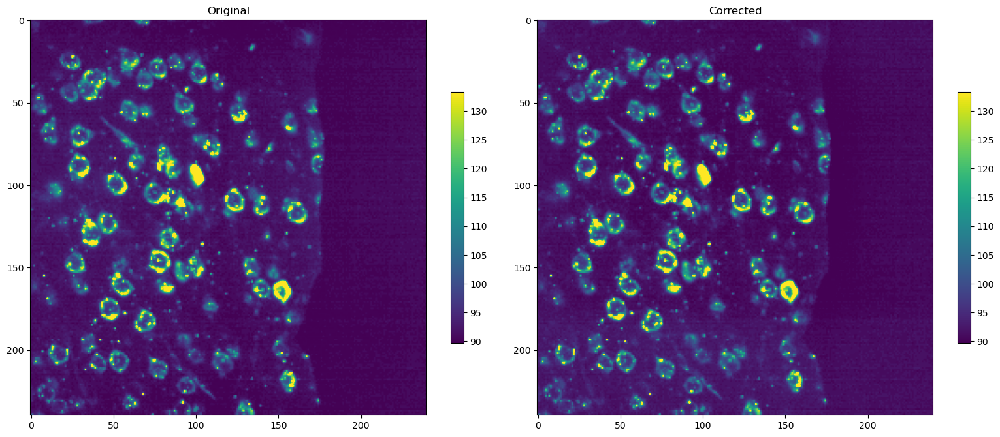

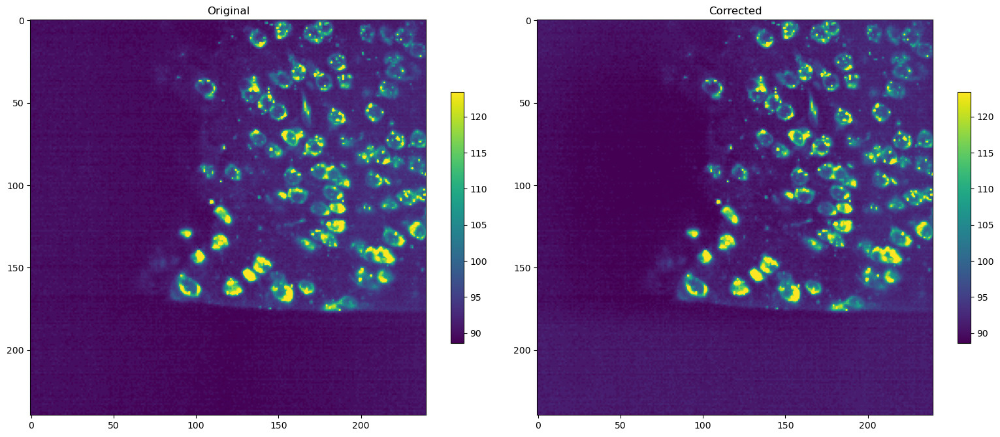

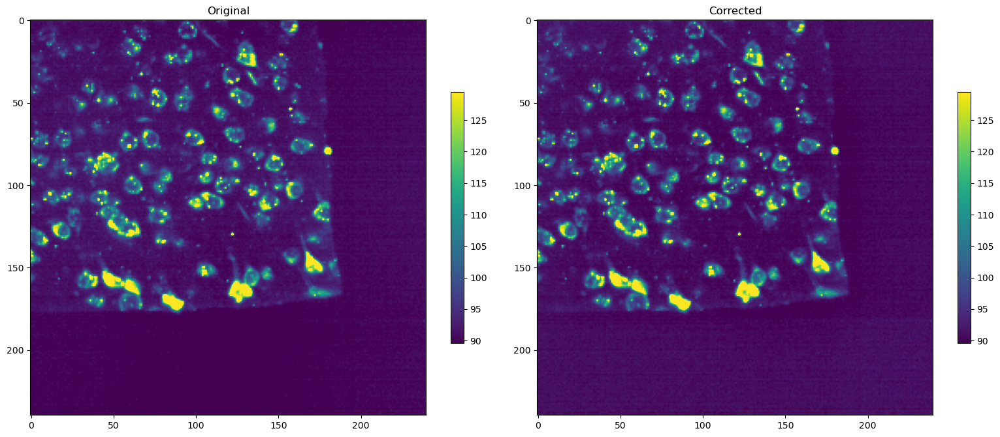

In [14]:
i = 50
for idx in range(4):
    i = 50+idx*n
    
    vmin = np.percentile(images_transformed[i], 5)
    vmax = np.percentile(images_transformed[i], 99)

    fig, axes = plt.subplots(1, 2, figsize=(16,8))
    im = axes[0].imshow(images[i], vmin=vmin, vmax=vmax)
    fig.colorbar(im, ax=axes[0], shrink=0.5)
    axes[0].set_title("Original")
    im = axes[1].imshow(images_transformed[i], vmin=vmin, vmax=vmax)
    fig.colorbar(im, ax=axes[1], shrink=0.5)
    axes[1].set_title("Corrected")
    fig.tight_layout()

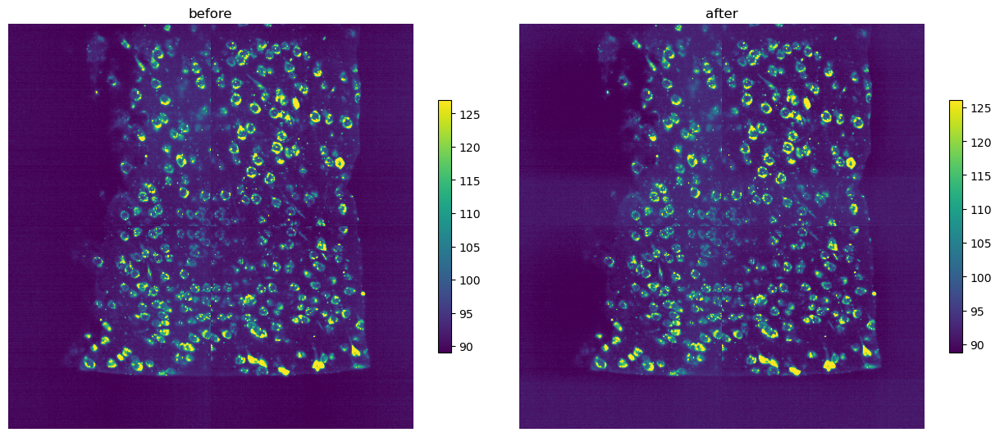

In [15]:
fig, axs = plt.subplots(1,2,figsize=(8*2,8*1))
ax = axs[0]
merged_img = np.vstack([
    np.hstack([images[50+0*n], images[50+1*n],]),
    np.hstack([images[50+2*n], images[50+3*n],]),
])
vmin = np.percentile(merged_img, 5)
vmax = np.percentile(merged_img, 99)
g = ax.imshow(merged_img, vmin=vmin, vmax=vmax)
ax.axis('off') #(False)
fig.colorbar(g, shrink=0.5)
ax.set_title('before')

ax = axs[1]
merged_img = np.vstack([
    np.hstack([images_transformed[50+0*n], images_transformed[50+1*n],]),
    np.hstack([images_transformed[50+2*n], images_transformed[50+3*n],]),
])
vmin = np.percentile(merged_img, 5)
vmax = np.percentile(merged_img, 99)
g = ax.imshow(merged_img, vmin=vmin, vmax=vmax)
ax.axis('off') #(False)
fig.colorbar(g, shrink=0.5)
ax.set_title('after')

fig.subplots_adjust(wspace=0.01)
plt.show()